# Ch07 - REINFORCE 策略梯度

直接参数化策略，用策略梯度定理更新。引入 baseline 减小方差。

> 本 Notebook 配套《强化学习全面教程》PDF 使用。

In [1]:
import numpy as np
import torch
import torch.nn as nn
import gymnasium as gym
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import random
from collections import deque, defaultdict

# 中文字体配置
import os, platform
if platform.system() == 'Linux' and os.path.exists('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf'):
    fm.fontManager.addfont('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf')
plt.rcParams['font.sans-serif'] = ['Noto Sans SC', 'DejaVu Sans', 'Arial Unicode MS']
plt.rcParams['axes.unicode_minus'] = False

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch: {torch.__version__} | 设备: {device} | Gymnasium: {gym.__version__}')


PyTorch: 2.13.0+cpu | 设备: cpu | Gymnasium: 1.3.0


## 7.1 策略梯度定理

策略梯度方法直接优化策略参数 $\theta$，最大化期望回报：
$$\nabla_\theta J(\theta) = E_{\pi_\theta}[\nabla_\theta \log \pi_\theta(a|s) \cdot Q^{\pi_\theta}(s,a)]$$

直观理解：若某动作的 Q 较高（'好'），就增大 $\log \pi(a|s)$ 的梯度。

## 7.2 REINFORCE 算法

REINFORCE 用实际回报 $G_t$ 替代 $Q^{\pi}$：
$$\theta \leftarrow \theta + \alpha \nabla_\theta \log \pi_\theta(a_t|s_t) \cdot G_t$$

**方差大** 是主要问题——$G_t$ 可能从 -100 到 +1000。**解决方法**：引入 baseline $V(s)$，用优势 $A(s,a) = Q(s,a) - V(s)$ 替代 $Q$。

In [2]:
import torch.optim as optim
from torch.distributions import Categorical

class PolicyNetwork(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
            nn.Linear(hidden, action_dim),
        )
    def forward(self, x): return self.net(x)


class ValueNetwork(nn.Module):
    def __init__(self, state_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
            nn.Linear(hidden, 1),
        )
    def forward(self, x): return self.net(x).squeeze(-1)


class REINFORCEAgent:
    def __init__(self, state_dim, action_dim, lr=1e-3, gamma=0.99, use_baseline=True):
        self.device = device
        self.gamma = gamma
        self.use_baseline = use_baseline
        self.policy = PolicyNetwork(state_dim, action_dim).to(device)
        self.optimizer = optim.Adam(self.policy.parameters(), lr=lr)
        if use_baseline:
            self.value = ValueNetwork(state_dim).to(device)
            self.value_optim = optim.Adam(self.value.parameters(), lr=lr)

    def select_action(self, state):
        s = torch.as_tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
        logits = self.policy(s)
        dist = Categorical(logits=logits)
        a = dist.sample()
        return a.item(), dist.log_prob(a)

    def update(self, trajectory):
        log_probs, values, rewards = zip(*trajectory)
        log_probs = torch.stack(log_probs)
        rewards = list(rewards)

        returns = []
        G = 0
        for r in reversed(rewards):
            G = self.gamma * G + r
            returns.insert(0, G)
        returns = torch.tensor(returns, dtype=torch.float32, device=device)

        if self.use_baseline:
            values = torch.stack(values)
            advantages = returns - values.detach()
            if advantages.numel() > 1:
                advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
            value_loss = nn.functional.mse_loss(values, returns)
            self.value_optim.zero_grad()
            value_loss.backward()
            self.value_optim.step()
        else:
            advantages = returns
            if advantages.numel() > 1:
                advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        policy_loss = -(log_probs * advantages).sum()
        self.optimizer.zero_grad()
        policy_loss.backward()
        nn.utils.clip_grad_norm_(self.policy.parameters(), 5.0)
        self.optimizer.step()

env = gym.make('CartPole-v1')
agent = REINFORCEAgent(env.observation_space.shape[0], env.action_space.n, use_baseline=True)
print('REINFORCE Agent 创建完成 ✓')

REINFORCE Agent 创建完成 ✓


## 7.3 训练循环

In [3]:
random.seed(42); np.random.seed(42); torch.manual_seed(42)
episodes = 300
max_steps = 500
rewards = []

for ep in range(episodes):
    s, _ = env.reset(seed=42 + ep)
    trajectory = []
    total_r = 0
    for t in range(max_steps):
        a, log_prob = agent.select_action(s)
        if agent.use_baseline:
            v = agent.value(torch.as_tensor(s, dtype=torch.float32, device=device).unsqueeze(0))
        else:
            v = torch.tensor(0.0, device=device)
        s_next, r, terminated, truncated, _ = env.step(a)
        trajectory.append((log_prob.squeeze(), v.squeeze(), r))
        s = s_next
        total_r += r
        if terminated or truncated: break
    agent.update(trajectory)
    rewards.append(total_r)
    if (ep + 1) % 20 == 0:
        print(f'ep {ep+1:3d} | reward={total_r:5.1f} | avg20={np.mean(rewards[-20:]):5.1f}')

ep  20 | reward= 13.0 | avg20= 13.2
ep  40 | reward= 10.0 | avg20= 20.1
ep  60 | reward= 24.0 | avg20= 39.8
ep  80 | reward=148.0 | avg20= 86.6
ep 100 | reward=127.0 | avg20=153.4
ep 120 | reward=276.0 | avg20=243.7
ep 140 | reward=500.0 | avg20=303.9
ep 160 | reward=225.0 | avg20=394.4
ep 180 | reward=500.0 | avg20=458.3
ep 200 | reward=122.0 | avg20=231.9
ep 220 | reward=500.0 | avg20=275.9
ep 240 | reward=379.0 | avg20=439.9
ep 260 | reward=500.0 | avg20=469.2
ep 280 | reward=259.0 | avg20=455.6
ep 300 | reward=500.0 | avg20=473.8


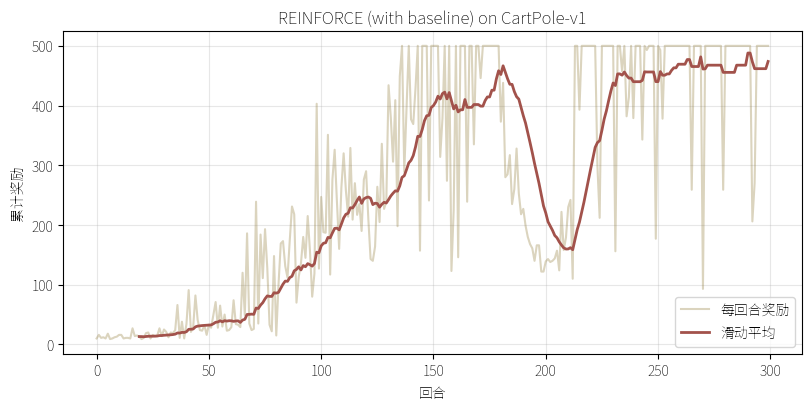

In [4]:
fig, ax = plt.subplots(figsize=(8, 4), constrained_layout=True)
ax.plot(rewards, alpha=0.3, color='#887129', label='每回合奖励')
if len(rewards) >= 20:
    ma = np.convolve(rewards, np.ones(20)/20, mode='valid')
    ax.plot(range(19, len(rewards)), ma, color='#a2524b', linewidth=2, label='滑动平均')
ax.set_xlabel('回合'); ax.set_ylabel('累计奖励')
ax.set_title('REINFORCE (with baseline) on CartPole-v1')
ax.legend(loc='lower right'); ax.grid(alpha=0.3)
plt.show()

## 7.4 可视化训练效果

用训练好的策略跑一回合 CartPole，动画展示小车平衡杆的控制效果。

In [6]:
from viz_utils import visualize_cartpole

def _policy_fn(s):
    with torch.no_grad():
        s_t = torch.as_tensor(s, dtype=torch.float32, device=device).unsqueeze(0)
        return int(agent.policy(s_t).argmax(dim=1).item())

visualize_cartpole(_policy_fn, title='REINFORCE 策略可视化',max_steps=500)

## 7.5 小结

**REINFORCE 局限**：
- 必须等回合结束才能更新
- 方差大（即使加 baseline）
- 样本效率低（on-policy）

下一章：**Actor-Critic**——用 TD 误差替代 G_t，单步更新 + 小方差。